In [2]:
!pip install -U git+https://github.com/qubvel-org/segmentation_models.pytorch
!pip install lightning albumentations

  Cloning https://github.com/qubvel-org/segmentation_models.pytorch to /tmp/pip-req-build-o4y7zq6j
  Running command git clone --filter=blob:none --quiet https://github.com/qubvel-org/segmentation_models.pytorch /tmp/pip-req-build-o4y7zq6j
  Resolved https://github.com/qubvel-org/segmentation_models.pytorch to commit d9a9c75f4851ff3ae8b38bc755ca41f317e3af3d
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for segmentation_models_pytorch: filename=segmentation_models_pytorch-0.4.1.dev0-py3-none-any.whl size=141653 sha256=9b1f0a86d6533d6b73c82199c1898d4ca2fc6b375ca989418cda4ea7f4da2c48
  Stored in directory: /tmp/pip-ephem-wheel-cache-0znjgxxu/wheels/0d/83/d1/41399162ce4c72add04b4bbae3c04cc0762147765d1d00d2fb
Successfully built segmentation_models_pytorch
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 818.9/818.9 kB 38.0 MB/s eta 0:00:00


In [2]:
# %% [code] Cellule 1 : Import des bibliothèques nécessaires
import os
import glob
import json
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

import albumentations as A
# Vous pouvez ajouter d'autres imports d'albumentations si besoin

import segmentation_models_pytorch as smp

# Vérifier si un GPU est disponible
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Utilisation de l'appareil :", device)


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Utilisation de l'appareil : cuda


In [3]:
# %% [code] : Classe dataset adaptée sans fichier JSON
class Sentinel2Dataset(Dataset):
    """
    Dataset pour la segmentation des routes.
    Il extrait des patchs de taille patch_size x patch_size à partir d'images de grande taille
    en utilisant une fenêtre glissante sans chevauchement.
    """
    def __init__(self, root_dir, split='train', transform=None, patch_size=512, stride=512):
        """
        Args:
            root_dir (str): Chemin racine du dataset (ex: "/kaggle/input/mon_dataset").
            split (str): 'train', 'valid' ou 'test'.
            transform: Transformations à appliquer (albumentations).
            patch_size (int): Taille du patch (par défaut 512).
            stride (int): Pas de la fenêtre glissante (par défaut 512, donc sans chevauchement).
        """
        self.transform = transform
        self.patch_size = patch_size
        self.stride = stride
        
        # Définir les répertoires d'images et de masques en fonction du split
        self.image_dir = os.path.join(root_dir, split, "images")
        self.mask_dir = os.path.join(root_dir, split, "masks")
        
        # Récupérer la liste des fichiers d'images et masques
        self.image_files = sorted(glob.glob(os.path.join(self.image_dir, "*")))
        self.mask_files = sorted(glob.glob(os.path.join(self.mask_dir, "*")))
        
        # Vérifier que le nombre d'images et de masques correspond
        assert len(self.image_files) == len(self.mask_files), "Le nombre d'images et de masques ne correspond pas!"
        
        # Créer la liste des patchs : pour chaque image, on stocke (chemin_image, chemin_masque, x, y)
        self.patches = []
        for img_path, mask_path in zip(self.image_files, self.mask_files):
            img = cv2.imread(img_path)
            if img is None:
                continue
            h, w, _ = img.shape
            for y in range(0, h, self.stride):
                for x in range(0, w, self.stride):
                    if y + self.patch_size <= h and x + self.patch_size <= w:
                        self.patches.append((img_path, mask_path, x, y))
                        
        print(f"Nombre de patchs pour le split {split} : {len(self.patches)}")
    
    def __len__(self):
        return len(self.patches)
    
    def __getitem__(self, index):
        img_path, mask_path, x, y = self.patches[index]
        # Lire l'image et le masque
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    
        # Extraire le patch correspondant
        image_patch = image[y:y+self.patch_size, x:x+self.patch_size]
        mask_patch = mask[y:y+self.patch_size, x:x+self.patch_size]
    
        # Normaliser le masque (convertir 0/255 en 0/1)
        mask_patch = mask_patch.astype(np.float32) / 255.0
    
        # Appliquer les transformations (si définies, par exemple pour l'entraînement)
        if self.transform:
           augmented = self.transform(image=image_patch, mask=mask_patch)
           image_patch = augmented['image']
           mask_patch = augmented['mask']
    
        # Normaliser l'image de [0, 255] à [0, 1]
        image_patch = image_patch.astype(np.float32) / 255.0
       # Changer l'ordre des canaux pour obtenir (C, H, W)
        image_patch = np.transpose(image_patch, (2, 0, 1))
        image_patch = torch.tensor(image_patch, dtype=torch.float)
    
        # Convertir le masque en tensor (la dimension du canal sera ajoutée pour correspondre à la sortie du modèle)
        mask_patch = torch.tensor(mask_patch, dtype=torch.float)
        mask_patch = mask_patch.unsqueeze(0)
    
        return image_patch, mask_patch

     

In [4]:
# %% [code] Cellule 3 : Définition de la fonction d'augmentation
def transformer(p=0.5):
    """
    Fonction de transformation utilisant albumentations pour la data augmentation.
    Seules les images d'entraînement seront augmentées.
    """
    return A.Compose([
        # Recadrage aléatoire redimensionné
        A.RandomResizedCrop(
            height=512,
            width=512,
            p=0.2
        ),
        # Déplacement, mise à l'échelle et rotation
        A.ShiftScaleRotate(
            p=0.5,
            shift_limit=0.0625,
            scale_limit=0.05,
            rotate_limit=10,
            border_mode=0,  # bord constant
            value=0,
            mask_value=0,
            interpolation=2,  # interpolation bicubique
        ),
        # Flip, transposition et rotation de 90 degrés aléatoire
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.Transpose(p=0.5),
        A.RandomRotate90(p=0.5),
    ], p=p)


In [5]:
# %% [code] : Création des datasets et DataLoaders sans fichier JSON
# Définir le chemin racine de votre dataset Kaggle
dataset_root = "/kaggle/input/dpglobe/deepglobe"  # Adaptez ce chemin selon votre environnement

# Création des datasets pour l'entraînement et la validation
train_dataset = Sentinel2Dataset(root_dir=dataset_root, split='train', transform=transformer(p=0.5))
valid_dataset = Sentinel2Dataset(root_dir=dataset_root, split='valid', transform=None)

# Création des DataLoaders (batch = 8)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=8, shuffle=False, num_workers=4)


Nombre de patchs pour le split train : 19920
Nombre de patchs pour le split valid : 4984


In [6]:
# %% [code] Cellule 5 : Définition du modèle U-Net avec ResNet50
# Création du modèle avec segmentation_models_pytorch
model = smp.UnetPlusPlus(
    encoder_name="resnet50",        # Choix du backbone
    encoder_weights="imagenet",       # Poids pré-entraînés sur ImageNet
    in_channels=3,                    # Entrée en RGB
    classes=1,                        # Segmentation binaire (1 canal en sortie)
)

model.to(device)


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

UnetPlusPlus(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential

In [7]:
# %% [code] Cellule 6 : Définition de la fonction de perte et de l'optimiseur
criterion = nn.BCEWithLogitsLoss()  # Adapté pour la segmentation binaire
optimizer = optim.Adam(model.parameters(), lr=1e-4)


In [8]:
# %% [code] Cellule 7 : Fonctions de calcul des métriques
def compute_metrics(outputs, masks, threshold=0.5):
    """
    Calcule les vrais positifs (TP), faux positifs (FP) et faux négatifs (FN) pour un batch.
    
    Args:
        outputs (tensor): sorties brutes du modèle (logits) de taille (B, 1, H, W)
        masks (tensor): masques ground truth de taille (B, 1, H, W)
        threshold (float): seuil pour binariser la sortie (après sigmoid)
        
    Returns:
        TP, FP, FN cumulés pour le batch.
    """
    # Appliquer la sigmoid pour obtenir les probabilités
    probs = torch.sigmoid(outputs)
    preds = (probs > threshold).float()
    
    masks = masks.float()
    TP = (preds * masks).sum()
    FP = (preds * (1 - masks)).sum()
    FN = ((1 - preds) * masks).sum()
    
    return TP.item(), FP.item(), FN.item()

def calculate_epoch_metrics(TP, FP, FN, eps=1e-6):
    """
    Calcule IoU, Précision, Rappel et F1-score à partir des sommes de TP, FP et FN.
    """
    IoU = TP / (TP + FP + FN + eps)
    precision = TP / (TP + FP + eps)
    recall = TP / (TP + FN + eps)
    f1 = 2 * precision * recall / (precision + recall + eps)
    return IoU, precision, recall, f1


In [9]:
# %% [code] Cellule 8 : Boucle d'entraînement et validation avec enregistrement des métriques
num_epochs = 10  # Vous pouvez ajuster le nombre d'époques
metrics_history = []   # Liste pour stocker les métriques par époque

for epoch in range(num_epochs):
    model.train()
    train_loss = 0.0
    train_TP, train_FP, train_FN = 0, 0, 0
    
    for images, masks in train_loader:
        images = images.to(device)
        masks = masks.to(device).float()  # Conversion en float pour la loss
        
        optimizer.zero_grad()
        outputs = model(images)  # Sortie de taille (B, 1, H, W)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item() * images.size(0)
        TP, FP, FN = compute_metrics(outputs, masks)
        train_TP += TP
        train_FP += FP
        train_FN += FN
        
    train_loss /= len(train_loader.dataset)
    train_IoU, train_precision, train_recall, train_f1 = calculate_epoch_metrics(train_TP, train_FP, train_FN)
    
    # Phase de validation
    model.eval()
    valid_loss = 0.0
    valid_TP, valid_FP, valid_FN = 0, 0, 0
    with torch.no_grad():
        for images, masks in valid_loader:
            images = images.to(device)
            masks = masks.to(device).float()
            outputs = model(images)
            loss = criterion(outputs, masks)
            valid_loss += loss.item() * images.size(0)
            TP, FP, FN = compute_metrics(outputs, masks)
            valid_TP += TP
            valid_FP += FP
            valid_FN += FN
            
    valid_loss /= len(valid_loader.dataset)
    valid_IoU, valid_precision, valid_recall, valid_f1 = calculate_epoch_metrics(valid_TP, valid_FP, valid_FN)
    
    print(f"Epoch [{epoch+1}/{num_epochs}] Train Loss: {train_loss:.4f} | Val Loss: {valid_loss:.4f}")
    print(f"Train - IoU: {train_IoU:.4f}, Précision: {train_precision:.4f}, Rappel: {train_recall:.4f}, F1: {train_f1:.4f}")
    print(f"Valid - IoU: {valid_IoU:.4f}, Précision: {valid_precision:.4f}, Rappel: {valid_recall:.4f}, F1: {valid_f1:.4f}\n")
    
    # Enregistrer les métriques de l'époque
    metrics_history.append({
         'epoch': epoch+1,
         'train_loss': train_loss,
         'valid_loss': valid_loss,
         'train_IoU': train_IoU,
         'train_precision': train_precision,
         'train_recall': train_recall,
         'train_f1': train_f1,
         'valid_IoU': valid_IoU,
         'valid_precision': valid_precision,
         'valid_recall': valid_recall,
         'valid_f1': valid_f1,
    })

# Sauvegarder l'historique des métriques dans un fichier CSV
metrics_df = pd.DataFrame(metrics_history)
metrics_df.to_csv("metrics_history111.csv", index=False)
print("Les métriques ont été sauvegardées dans 'metrics_history111.csv'.")


Epoch [1/10] Train Loss: 0.1216 | Val Loss: 0.0585
Train - IoU: 0.4229, Précision: 0.6102, Rappel: 0.5794, F1: 0.5944
Valid - IoU: 0.5627, Précision: 0.7656, Rappel: 0.6798, F1: 0.7202

Epoch [2/10] Train Loss: 0.0574 | Val Loss: 0.0521
Train - IoU: 0.5523, Précision: 0.7908, Rappel: 0.6468, F1: 0.7116
Valid - IoU: 0.5814, Précision: 0.8172, Rappel: 0.6683, F1: 0.7353

Epoch [3/10] Train Loss: 0.0534 | Val Loss: 0.0504
Train - IoU: 0.5753, Précision: 0.8017, Rappel: 0.6707, F1: 0.7304
Valid - IoU: 0.6079, Précision: 0.7754, Rappel: 0.7378, F1: 0.7561

Epoch [4/10] Train Loss: 0.0504 | Val Loss: 0.0478
Train - IoU: 0.5935, Précision: 0.8082, Rappel: 0.6908, F1: 0.7449
Valid - IoU: 0.6215, Précision: 0.7879, Rappel: 0.7463, F1: 0.7665

Epoch [5/10] Train Loss: 0.0490 | Val Loss: 0.0468
Train - IoU: 0.6024, Précision: 0.8129, Rappel: 0.6994, F1: 0.7519
Valid - IoU: 0.6087, Précision: 0.8450, Rappel: 0.6852, F1: 0.7568

Epoch [6/10] Train Loss: 0.0473 | Val Loss: 0.0483
Train - IoU: 0.6128

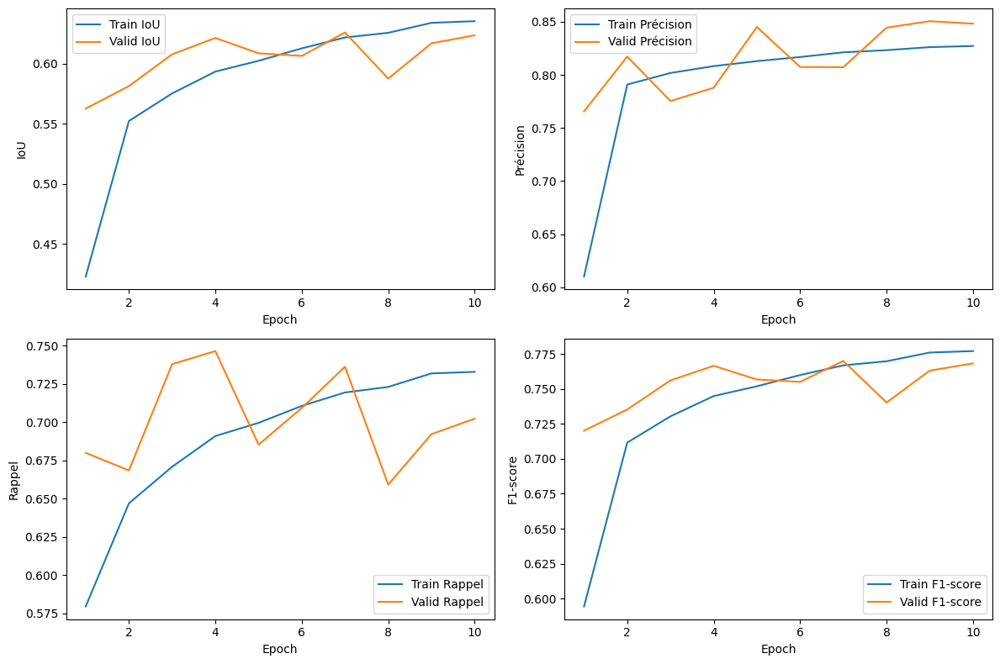

In [10]:
# %% [code] Cellule 9 : Affichage des courbes d'évolution des métriques
epochs = metrics_df['epoch']

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(epochs, metrics_df['train_IoU'], label='Train IoU')
plt.plot(epochs, metrics_df['valid_IoU'], label='Valid IoU')
plt.xlabel("Epoch")
plt.ylabel("IoU")
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(epochs, metrics_df['train_precision'], label='Train Précision')
plt.plot(epochs, metrics_df['valid_precision'], label='Valid Précision')
plt.xlabel("Epoch")
plt.ylabel("Précision")
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(epochs, metrics_df['train_recall'], label='Train Rappel')
plt.plot(epochs, metrics_df['valid_recall'], label='Valid Rappel')
plt.xlabel("Epoch")
plt.ylabel("Rappel")
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(epochs, metrics_df['train_f1'], label='Train F1-score')
plt.plot(epochs, metrics_df['valid_f1'], label='Valid F1-score')
plt.xlabel("Epoch")
plt.ylabel("F1-score")
plt.legend()

plt.tight_layout()
plt.show()


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

<ipython-input-3-0466ae30b056>:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


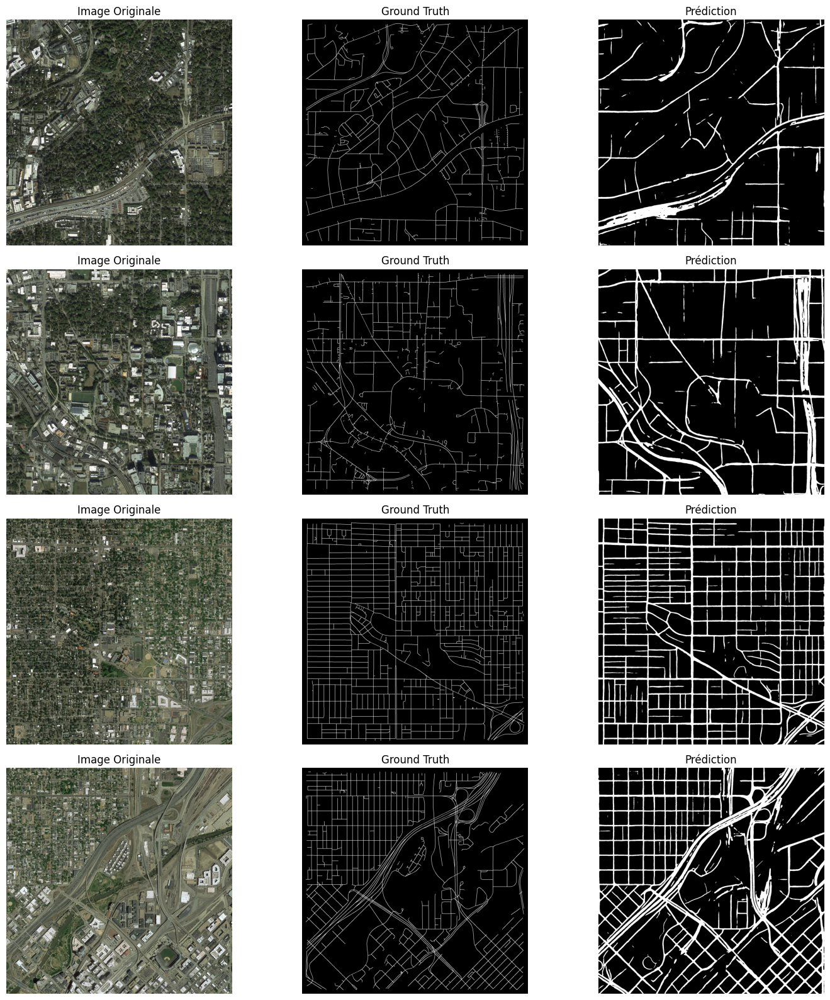

In [3]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from segmentation_models_pytorch import Unet  # Modifier selon votre modèle
import os

# 🔹 Définition du device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔹 Charger le modèle
def load_model(model_path):
    model = Unet(encoder_name="resnet50", in_channels=3, classes=1)  # Modifier selon votre modèle
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()
    return model

# 🔹 Fonction de prétraitement de l’image
def preprocess_image(image_path, img_size=2048):
    image = cv2.imread(image_path)  
    if image is None:
        raise FileNotFoundError(f"L'image n'a pas été trouvée : {image_path}")
        
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
    image = cv2.resize(image, (img_size, img_size))  

    # Normalisation (0-1) et transposition en (C, H, W)
    image = image / 255.0
    image = np.transpose(image, (2, 0, 1))  

    image = torch.tensor(image, dtype=torch.float32).unsqueeze(0).to(device)
    
    return image

# 🔹 Fonction d’inférence
def predict_image(model, image_path, threshold=0.3, img_size=2048):
    image = preprocess_image(image_path, img_size)
    
    with torch.no_grad():
        output = model(image)  
        probs = torch.sigmoid(output)
        pred = (probs > threshold).float().cpu().numpy()

    return pred[0, 0]  # Retourne le masque de segmentation

# 🔹 Fonction pour afficher 4 images avec GT et prédictions
def show_multiple_predictions(model, image_dir, mask_dir, num_samples=4, img_size=2048):
    """
    Affiche `num_samples` images complètes du dataset de validation avec leurs masques et prédictions.
    
    Args:
        model (torch.nn.Module): Modèle PyTorch chargé.
        image_dir (str): Dossier contenant les images de validation.
        mask_dir (str): Dossier contenant les masques Ground Truth.
        num_samples (int): Nombre d'images à afficher.
        img_size (int): Taille d'entrée du modèle.
    """
    image_files = sorted(os.listdir(image_dir))[:num_samples]  # Sélectionner les premières images

    plt.figure(figsize=(15, num_samples * 4))
    
    for idx, image_file in enumerate(image_files):
        image_path = os.path.join(image_dir, image_file)
        mask_path = os.path.join(mask_dir, image_file.replace("_sat.png", "_gt.png"))  # Adaptez l'extension

        # Charger l’image originale
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_resized = cv2.resize(image, (img_size, img_size))

        # Charger le masque Ground Truth
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask_resized = cv2.resize(mask, (img_size, img_size))

        # Obtenir la prédiction du modèle
        pred_mask = predict_image(model, image_path, img_size=img_size)

        # Affichage
        plt.subplot(num_samples, 3, idx * 3 + 1)
        plt.imshow(image_resized)
        plt.title("Image Originale")
        plt.axis("off")

        plt.subplot(num_samples, 3, idx * 3 + 2)
        plt.imshow(mask_resized, cmap="gray")
        plt.title("Ground Truth")
        plt.axis("off")

        plt.subplot(num_samples, 3, idx * 3 + 3)
        plt.imshow(pred_mask, cmap="gray")
        plt.title("Prédiction")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# 🔹 Charger le modèle
model_path = "/kaggle/input/unett/pytorch/default/1/road_segmentation_modelUnet.pth"
model = load_model(model_path)

# 🔹 Définir les dossiers d'images et de masques (Modifiez selon votre dataset)
image_dir = "/kaggle/input/validtest/valid/images"
mask_dir = "/kaggle/input/validtest/valid/masks"


# 🔹 Afficher 4 images complètes
show_multiple_predictions(model, image_dir, mask_dir, num_samples=4, img_size=2048)


<ipython-input-62-f0adc9c0df2f>:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


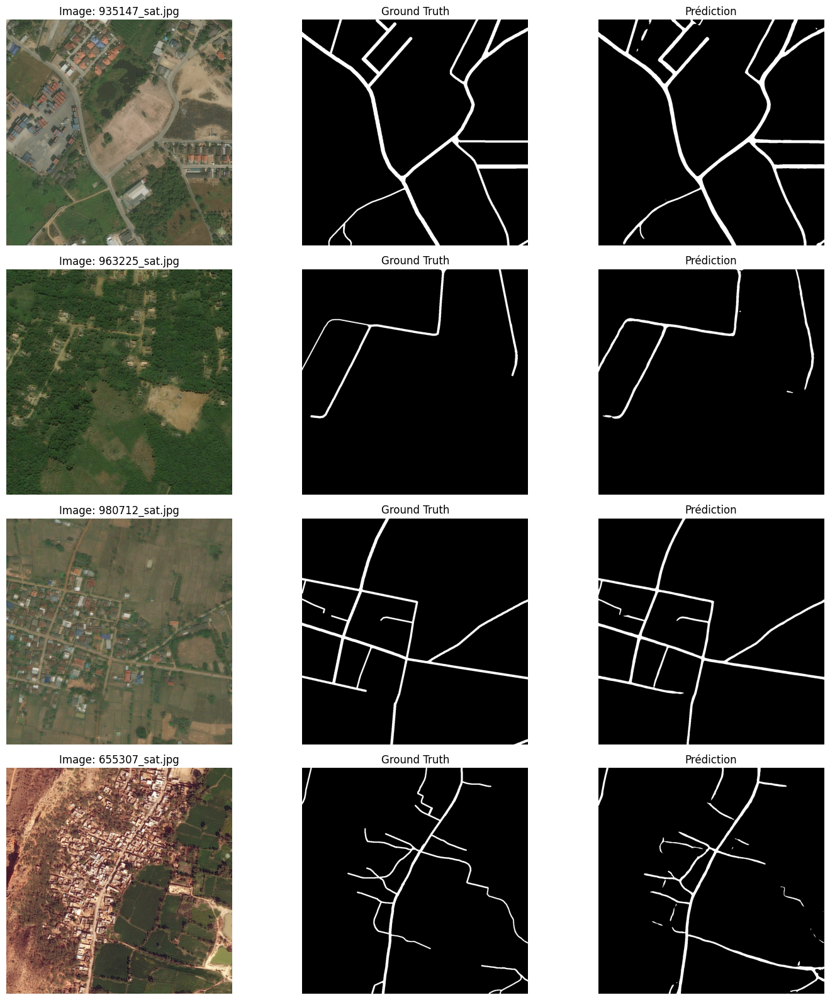

In [62]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from segmentation_models_pytorch import UnetPlusPlus  # Modifier selon votre modèle
import os

# 🔹 Définition du device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔹 Charger le modèle
def load_model(model_path):
    model = Unet(encoder_name="resnet50", in_channels=3, classes=1)  # Modifier selon votre modèle
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()
    return model

# 🔹 Fonction de prétraitement de l’image
def preprocess_image(image_path, img_size=1024):
    image = cv2.imread(image_path)  
    if image is None:
        raise FileNotFoundError(f"L'image n'a pas été trouvée : {image_path}")
        
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
    image = cv2.resize(image, (img_size, img_size))  

    # Normalisation (0-1) et transposition en (C, H, W)
    image = image / 255.0
    image = np.transpose(image, (2, 0, 1))  

    image = torch.tensor(image, dtype=torch.float32).unsqueeze(0).to(device)
    
    return image

# 🔹 Fonction d’inférence
def predict_image(model, image_path, threshold=0.3, img_size=1024):
    image = preprocess_image(image_path, img_size)
    
    with torch.no_grad():
        output = model(image)  
        probs = torch.sigmoid(output)
        pred = (probs > threshold).float().cpu().numpy()

    return pred[0, 0]  # Retourne le masque de segmentation

# 🔹 Fonction pour afficher des images spécifiques avec GT et prédictions
def show_selected_predictions(model, image_paths, mask_paths, img_size=1024):
    """
    Affiche des images spécifiques du dataset de validation avec leurs masques et prédictions.

    Args:
        model (torch.nn.Module): Modèle PyTorch chargé.
        image_paths (list): Liste des chemins des images originales.
        mask_paths (list): Liste des chemins des masques Ground Truth correspondants.
        img_size (int): Taille d'entrée du modèle.
    """
    num_samples = len(image_paths)
    
    plt.figure(figsize=(15, num_samples * 4))
    
    for idx, (image_path, mask_path) in enumerate(zip(image_paths, mask_paths)):
        image_name = os.path.basename(image_path)  # Extraire le nom du fichier

        # Charger l’image originale
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_resized = cv2.resize(image, (img_size, img_size))

        # Charger le masque Ground Truth
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask_resized = cv2.resize(mask, (img_size, img_size))

        # Obtenir la prédiction du modèle
        pred_mask = predict_image(model, image_path, img_size=img_size)

        # Affichage
        plt.subplot(num_samples, 3, idx * 3 + 1)
        plt.imshow(image_resized)
        plt.title(f"Image: {image_name}")  # Affiche le nom de l'image
        plt.axis("off")

        plt.subplot(num_samples, 3, idx * 3 + 2)
        plt.imshow(mask_resized, cmap="gray")
        plt.title("Ground Truth")
        plt.axis("off")

        plt.subplot(num_samples, 3, idx * 3 + 3)
        plt.imshow(pred_mask, cmap="gray")
        plt.title("Prédiction")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# 🔹 Charger le modèle
model_path = "/kaggle/input/unett/pytorch/default/1/road_segmentation_modelUnet.pth"
model = load_model(model_path)

# 🔹 Spécifier les images et leurs masques correspondants
image_paths = [
    "/kaggle/input/dpglobe/deepglobe/valid/images/935147_sat.jpg",
    "/kaggle/input/dpglobe/deepglobe/valid/images/963225_sat.jpg",
    "/kaggle/input/dpglobe/deepglobe/valid/images/980712_sat.jpg",
    "/kaggle/input/dpglobe/deepglobe/valid/images/655307_sat.jpg"
]

mask_paths = [
    "/kaggle/input/dpglobe/deepglobe/valid/masks/935147_mask.png",
    "/kaggle/input/dpglobe/deepglobe/valid/masks/963225_mask.png",
    "/kaggle/input/dpglobe/deepglobe/valid/masks/980712_mask.png",
    "/kaggle/input/dpglobe/deepglobe/valid/masks/655307_mask.png"
]

# 🔹 Afficher les images spécifiques
show_selected_predictions(model, image_paths, mask_paths, img_size=1024)


In [9]:
# 🔹 Fonction pour sauvegarder les prédictions et afficher les résultats
def save_and_show_predictions(model, image_paths, mask_paths, output_dir="output_masks", img_size=1024):
    """
    Affiche des images spécifiques avec leurs masques et enregistre les prédictions.

    Args:
        model (torch.nn.Module): Modèle PyTorch chargé.
        image_paths (list): Liste des chemins des images originales.
        mask_paths (list): Liste des chemins des masques Ground Truth correspondants.
        output_dir (str): Dossier pour sauvegarder les masques prédits.
        img_size (int): Taille d'entrée du modèle.
    """
    os.makedirs(output_dir, exist_ok=True)  # Créer le dossier s'il n'existe pas

    num_samples = len(image_paths)
    
    plt.figure(figsize=(15, num_samples * 4))
    
    for idx, (image_path, mask_path) in enumerate(zip(image_paths, mask_paths)):
        image_name = os.path.basename(image_path)  # Extraire le nom du fichier

In [11]:
# 🔹 Enregistrer la prédiction en tant qu’image PNG
pred_mask_uint8 = (pred_mask * 255).astype(np.uint8)  # Convertir en format image
output_path = os.path.join(output_dir, f"pred_{image_name.replace('.jpg', '.png')}")
cv2.imwrite(output_path, pred_mask_uint8)

NameError: name 'pred_mask' is not defined

<ipython-input-71-35fd935068fd>:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(model_path, map_location=device)


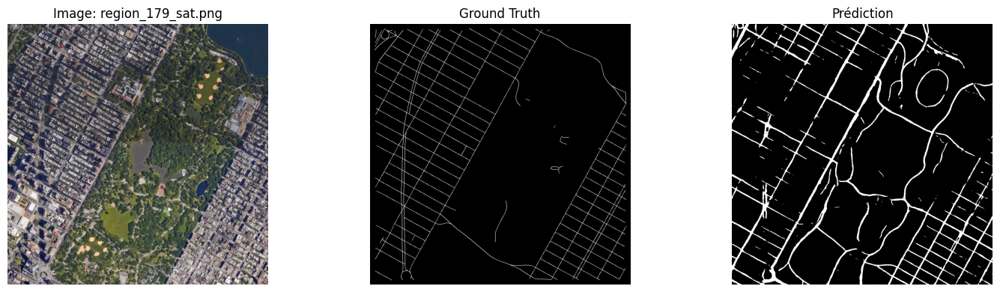

✅ Prédictions enregistrées dans output_masks et compressées dans predicted_masks.zip.


In [71]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import zipfile
from segmentation_models_pytorch import UnetPlusPlus  # Modifier selon votre modèle

# 🔹 Définition du device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔹 Charger le modèle correctement en restaurant l'architecture
def load_model(model_path):
    if not os.path.exists(model_path):
        raise FileNotFoundError(f"❌ Fichier modèle introuvable : {model_path}")

    # 🔹 Recréer l'architecture du modèle
    model = UnetPlusPlus(encoder_name="resnet50", in_channels=3, classes=1)  # Adapter selon votre cas

    # 🔹 Charger les poids
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)  # Charger les poids correctement

    model.to(device)
    model.eval()
    
    return model


# 🔹 Fonction de prétraitement de l’image
def preprocess_image(image_path, img_size=2048):
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"❌ Image introuvable : {image_path}")

    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (img_size, img_size))

    # Normalisation (0-1) et transposition en (C, H, W)
    image = image / 255.0
    image = np.transpose(image, (2, 0, 1))

    image = torch.tensor(image, dtype=torch.float32).unsqueeze(0).to(device)
    
    return image

# 🔹 Fonction d’inférence
def predict_image(model, image_path, threshold=0.3, img_size=2048):
    image = preprocess_image(image_path, img_size)
    
    with torch.no_grad():
        output = model(image)  
        probs = torch.sigmoid(output)
        pred = (probs > threshold).float().cpu().numpy()

    return pred[0, 0]  # Retourne le masque de segmentation

# 🔹 Fonction pour sauvegarder et afficher les résultats
def save_and_show_predictions(model, image_paths, mask_paths, output_dir="output_masks", img_size=2048):
    os.makedirs(output_dir, exist_ok=True)  # Créer le dossier s'il n'existe pas

    num_samples = len(image_paths)
    
    plt.figure(figsize=(15, num_samples * 4))
    
    for idx, (image_path, mask_path) in enumerate(zip(image_paths, mask_paths)):
        image_name = os.path.basename(image_path)  # Extraire le nom du fichier

        # Vérifier l'existence des fichiers
        if not os.path.exists(image_path):
            print(f"⚠️ Image non trouvée : {image_path}")
            continue
        if not os.path.exists(mask_path):
            print(f"⚠️ Masque non trouvé : {mask_path}")
            continue

        # Charger l’image originale
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_resized = cv2.resize(image, (img_size, img_size))

        # Charger le masque Ground Truth
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask_resized = cv2.resize(mask, (img_size, img_size))

        # Obtenir la prédiction du modèle
        pred_mask = predict_image(model, image_path, img_size=img_size)

        # 🔹 Enregistrer la prédiction en tant qu’image PNG
        pred_mask_uint8 = (pred_mask * 255).astype(np.uint8)  # Convertir en format image
        output_path = os.path.join(output_dir, f"pred_{image_name.replace('_sat.png', '_gt.png')}")
        cv2.imwrite(output_path, pred_mask_uint8)

        # Affichage
        plt.subplot(num_samples, 3, idx * 3 + 1)
        plt.imshow(image_resized)
        plt.title(f"Image: {image_name}")  
        plt.axis("off")

        plt.subplot(num_samples, 3, idx * 3 + 2)
        plt.imshow(mask_resized, cmap="gray")
        plt.title("Ground Truth")
        plt.axis("off")

        plt.subplot(num_samples, 3, idx * 3 + 3)
        plt.imshow(pred_mask, cmap="gray")
        plt.title("Prédiction")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

    # 🔹 Compresser les résultats dans un fichier ZIP pour téléchargement
    zip_filename = "predicted_masks.zip"
    with zipfile.ZipFile(zip_filename, "w") as zipf:
        for file in os.listdir(output_dir):
            zipf.write(os.path.join(output_dir, file), file)
    
    print(f"✅ Prédictions enregistrées dans {output_dir} et compressées dans {zip_filename}.")

# 🔹 Charger le modèle
model_path = "/kaggle/input/unetplus/pytorch/default/1/unetpp_model.pth"
model = load_model(model_path)

# 🔹 Spécifier les images et leurs masques correspondants
image_paths = [
    "/kaggle/input/validtest/valid/images/region_179_sat.png",
    
]

mask_paths = [
    "/kaggle/input/validtest/valid/masks/region_179_gt.png",
   
]

# 🔹 Afficher et enregistrer les prédictions
save_and_show_predictions(model, image_paths, mask_paths, img_size=2048)


<ipython-input-15-b71cf383a3cd>:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


✅ Image combinée sauvegardée sous : combined_results.png


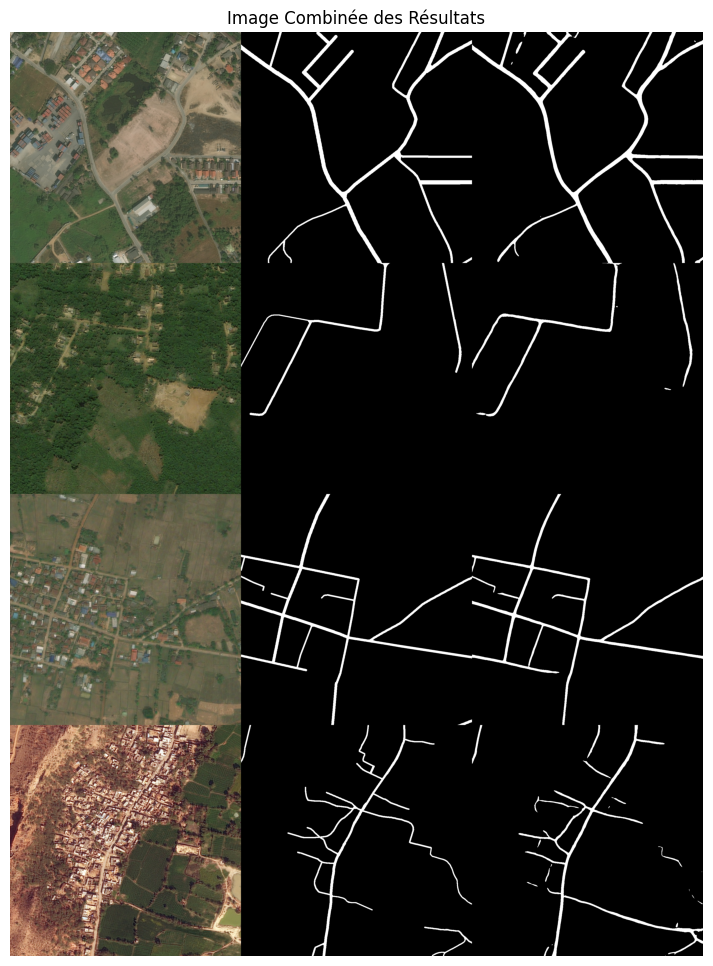

In [15]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from segmentation_models_pytorch import Unet
import os

# 🔹 Définition du device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔹 Charger le modèle
def load_model(model_path):
    model = Unet(encoder_name="resnet50", in_channels=3, classes=1)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()
    return model

# 🔹 Fonction de prétraitement de l’image
def preprocess_image(image_path, img_size=1024):
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"L'image n'a pas été trouvée : {image_path}")

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (img_size, img_size))

    image = image / 255.0
    image = np.transpose(image, (2, 0, 1))

    image = torch.tensor(image, dtype=torch.float32).unsqueeze(0).to(device)

    return image

# 🔹 Fonction d’inférence
def predict_image(model, image_path, threshold=0.3, img_size=1024):
    image = preprocess_image(image_path, img_size)

    with torch.no_grad():
        output = model(image)
        probs = torch.sigmoid(output)
        pred = (probs > threshold).float().cpu().numpy()

    return pred[0, 0]

# 🔹 Fonction pour combiner toutes les images en une seule grande image
def save_combined_results(model, image_paths, mask_paths, output_path="combined_results.png", img_size=1024):
    """
    Génère une seule grande image combinée contenant toutes les prédictions.

    Args:
        model (torch.nn.Module): Modèle PyTorch chargé.
        image_paths (list): Liste des chemins des images originales.
        mask_paths (list): Liste des chemins des masques Ground Truth correspondants.
        output_path (str): Chemin pour sauvegarder l'image combinée.
        img_size (int): Taille d'entrée du modèle.
    """
    all_rows = []  # Liste pour stocker toutes les lignes d'images

    for image_path, mask_path in zip(image_paths, mask_paths):
        # 🔹 Charger l’image originale
        image = cv2.imread(image_path)
        if image is None:
            raise FileNotFoundError(f"L'image n'a pas été trouvée : {image_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_resized = cv2.resize(image, (img_size, img_size))

        # 🔹 Charger le masque Ground Truth
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            raise FileNotFoundError(f"Le masque n'a pas été trouvé : {mask_path}")
        mask_resized = cv2.resize(mask, (img_size, img_size))

        # 🔹 Obtenir la prédiction du modèle
        pred_mask = predict_image(model, image_path, img_size=img_size)
        pred_mask_uint8 = (pred_mask * 255).astype(np.uint8)

        # 🔹 Concaténer les images (Originale | Ground Truth | Prédiction)
        combined_row = np.hstack([
            image_resized, 
            cv2.cvtColor(mask_resized, cv2.COLOR_GRAY2RGB), 
            cv2.cvtColor(pred_mask_uint8, cv2.COLOR_GRAY2RGB)
        ])

        all_rows.append(combined_row)  # Ajouter la ligne à la liste

    # 🔹 Empiler toutes les lignes verticalement pour créer une seule grande image
    final_image = np.vstack(all_rows)

    # 🔹 Sauvegarde de l'image combinée
    cv2.imwrite(output_path, cv2.cvtColor(final_image, cv2.COLOR_RGB2BGR))
    print(f"✅ Image combinée sauvegardée sous : {output_path}")

    # 🔹 Afficher l'image finale
    plt.figure(figsize=(15, len(image_paths) * 3))
    plt.imshow(final_image)
    plt.axis("off")
    plt.title("Image Combinée des Résultats")
    plt.show()

# 🔹 Charger le modèle
model_path = "/kaggle/input/unett/pytorch/default/1/road_segmentation_modelUnet.pth"
model = load_model(model_path)

# 🔹 Spécifier les images et leurs masques correspondants
image_paths = [
    "/kaggle/input/dpglobe/deepglobe/valid/images/935147_sat.jpg",
    "/kaggle/input/dpglobe/deepglobe/valid/images/963225_sat.jpg",
    "/kaggle/input/dpglobe/deepglobe/valid/images/980712_sat.jpg",
    "/kaggle/input/dpglobe/deepglobe/valid/images/655307_sat.jpg"
]

mask_paths = [
    "/kaggle/input/dpglobe/deepglobe/valid/masks/935147_mask.png",
    "/kaggle/input/dpglobe/deepglobe/valid/masks/963225_mask.png",
    "/kaggle/input/dpglobe/deepglobe/valid/masks/980712_mask.png",
    "/kaggle/input/dpglobe/deepglobe/valid/masks/655307_mask.png"
]

# 🔹 Générer et sauvegarder la grande image combinée
save_combined_results(model, image_paths, mask_paths, output_path="combined_results.png", img_size=1024)


<ipython-input-16-0c28bfccc23c>:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


✅ Image combinée sauvegardée sous : combined_results.png


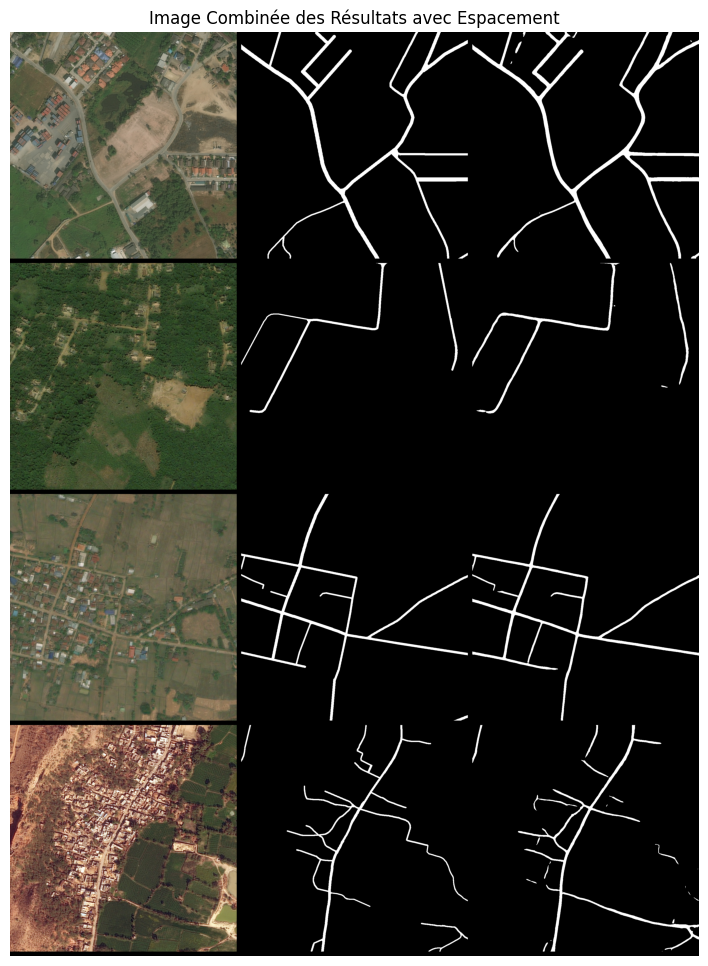

In [16]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from segmentation_models_pytorch import Unet
import os

# 🔹 Définition du device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔹 Charger le modèle
def load_model(model_path):
    model = Unet(encoder_name="resnet50", in_channels=3, classes=1)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()
    return model

# 🔹 Fonction de prétraitement de l’image
def preprocess_image(image_path, img_size=1024):
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"L'image n'a pas été trouvée : {image_path}")

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (img_size, img_size))

    image = image / 255.0
    image = np.transpose(image, (2, 0, 1))

    image = torch.tensor(image, dtype=torch.float32).unsqueeze(0).to(device)

    return image

# 🔹 Fonction d’inférence
def predict_image(model, image_path, threshold=0.3, img_size=1024):
    image = preprocess_image(image_path, img_size)

    with torch.no_grad():
        output = model(image)
        probs = torch.sigmoid(output)
        pred = (probs > threshold).float().cpu().numpy()

    return pred[0, 0]

# 🔹 Fonction pour combiner toutes les images avec séparation entre elles
def save_combined_results(model, image_paths, mask_paths, output_path="combined_results.png", img_size=1024, spacing=10):
    """
    Génère une seule grande image combinée contenant toutes les prédictions avec un espacement entre les images.

    Args:
        model (torch.nn.Module): Modèle PyTorch chargé.
        image_paths (list): Liste des chemins des images originales.
        mask_paths (list): Liste des chemins des masques Ground Truth correspondants.
        output_path (str): Chemin pour sauvegarder l'image combinée.
        img_size (int): Taille d'entrée du modèle.
        spacing (int): Espacement entre les images (en pixels).
    """
    all_rows = []  # Liste pour stocker toutes les lignes d'images

    for image_path, mask_path in zip(image_paths, mask_paths):
        # 🔹 Charger l’image originale
        image = cv2.imread(image_path)
        if image is None:
            raise FileNotFoundError(f"L'image n'a pas été trouvée : {image_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_resized = cv2.resize(image, (img_size, img_size))

        # 🔹 Charger le masque Ground Truth
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            raise FileNotFoundError(f"Le masque n'a pas été trouvé : {mask_path}")
        mask_resized = cv2.resize(mask, (img_size, img_size))

        # 🔹 Obtenir la prédiction du modèle
        pred_mask = predict_image(model, image_path, img_size=img_size)
        pred_mask_uint8 = (pred_mask * 255).astype(np.uint8)

        # 🔹 Ajouter un espacement (bordure noire) entre les images
        empty_space = np.zeros((img_size, spacing, 3), dtype=np.uint8)

        # 🔹 Concaténer les images avec espace entre elles
        combined_row = np.hstack([
            image_resized, empty_space,  
            cv2.cvtColor(mask_resized, cv2.COLOR_GRAY2RGB), empty_space,  
            cv2.cvtColor(pred_mask_uint8, cv2.COLOR_GRAY2RGB)
        ])

        all_rows.append(combined_row)  # Ajouter la ligne à la liste

        # 🔹 Ajouter un espace vide entre chaque ligne
        empty_row = np.zeros((spacing, combined_row.shape[1], 3), dtype=np.uint8)
        all_rows.append(empty_row)

    # 🔹 Empiler toutes les lignes verticalement pour créer une seule grande image
    final_image = np.vstack(all_rows)

    # 🔹 Sauvegarde de l'image combinée
    cv2.imwrite(output_path, cv2.cvtColor(final_image, cv2.COLOR_RGB2BGR))
    print(f"✅ Image combinée sauvegardée sous : {output_path}")

    # 🔹 Afficher l'image finale
    plt.figure(figsize=(15, len(image_paths) * 3))
    plt.imshow(final_image)
    plt.axis("off")
    plt.title("Image Combinée des Résultats avec Espacement")
    plt.show()

# 🔹 Charger le modèle
model_path = "/kaggle/input/unett/pytorch/default/1/road_segmentation_modelUnet.pth"
model = load_model(model_path)

# 🔹 Spécifier les images et leurs masques correspondants
image_paths = [
    "/kaggle/input/dpglobe/deepglobe/valid/images/935147_sat.jpg",
    "/kaggle/input/dpglobe/deepglobe/valid/images/963225_sat.jpg",
    "/kaggle/input/dpglobe/deepglobe/valid/images/980712_sat.jpg",
    "/kaggle/input/dpglobe/deepglobe/valid/images/655307_sat.jpg"
]

mask_paths = [
    "/kaggle/input/dpglobe/deepglobe/valid/masks/935147_mask.png",
    "/kaggle/input/dpglobe/deepglobe/valid/masks/963225_mask.png",
    "/kaggle/input/dpglobe/deepglobe/valid/masks/980712_mask.png",
    "/kaggle/input/dpglobe/deepglobe/valid/masks/655307_mask.png"
]

# 🔹 Générer et sauvegarder la grande image combinée avec séparation entre les images
save_combined_results(model, image_paths, mask_paths, output_path="combined_results.png", img_size=1024, spacing=20)


<ipython-input-33-fbae8670a428>:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


✅ Image combinée sauvegardée sous : combinedddd_results.png


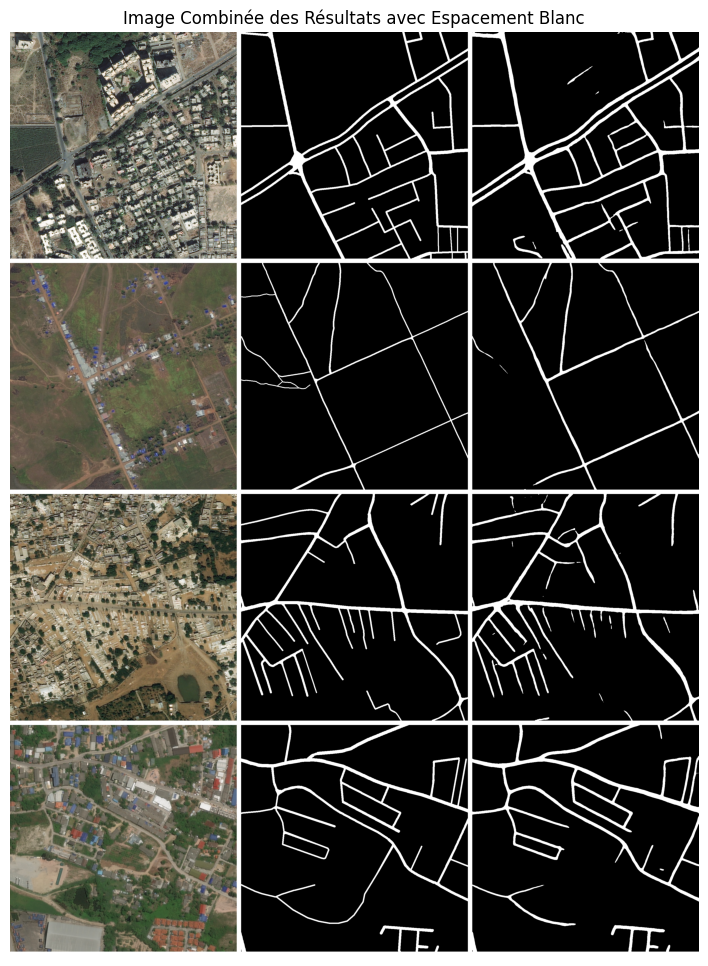

In [33]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from segmentation_models_pytorch import Unet
import os

# 🔹 Définition du device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔹 Charger le modèle
def load_model(model_path):
    model = Unet(encoder_name="resnet50", in_channels=3, classes=1)
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()
    return model

# 🔹 Fonction de prétraitement de l’image
def preprocess_image(image_path, img_size=1024):
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"L'image n'a pas été trouvée : {image_path}")

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (img_size, img_size))

    image = image / 255.0
    image = np.transpose(image, (2, 0, 1))

    image = torch.tensor(image, dtype=torch.float32).unsqueeze(0).to(device)

    return image

# 🔹 Fonction d’inférence
def predict_image(model, image_path, threshold=0.3, img_size=1024):
    image = preprocess_image(image_path, img_size)

    with torch.no_grad():
        output = model(image)
        probs = torch.sigmoid(output)
        pred = (probs > threshold).float().cpu().numpy()

    return pred[0, 0]

# 🔹 Fonction pour combiner toutes les images avec un espacement blanc
def save_combined_results(model, image_paths, mask_paths, output_path="combined_results.png", img_size=1024, spacing=20):
    """
    Génère une seule grande image combinée contenant toutes les prédictions avec un espacement blanc entre les images.

    Args:
        model (torch.nn.Module): Modèle PyTorch chargé.
        image_paths (list): Liste des chemins des images originales.
        mask_paths (list): Liste des chemins des masques Ground Truth correspondants.
        output_path (str): Chemin pour sauvegarder l'image combinée.
        img_size (int): Taille d'entrée du modèle.
        spacing (int): Espacement entre les images (en pixels).
    """
    all_rows = []  # Liste pour stocker toutes les lignes d'images

    for image_path, mask_path in zip(image_paths, mask_paths):
        # 🔹 Charger l’image originale
        image = cv2.imread(image_path)
        if image is None:
            raise FileNotFoundError(f"L'image n'a pas été trouvée : {image_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_resized = cv2.resize(image, (img_size, img_size))

        # 🔹 Charger le masque Ground Truth
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            raise FileNotFoundError(f"Le masque n'a pas été trouvé : {mask_path}")
        mask_resized = cv2.resize(mask, (img_size, img_size))

        # 🔹 Obtenir la prédiction du modèle
        pred_mask = predict_image(model, image_path, img_size=img_size)
        pred_mask_uint8 = (pred_mask * 255).astype(np.uint8)

        # 🔹 Ajouter un espacement (bordure blanche) entre les images
        empty_space = np.full((img_size, spacing, 3), 255, dtype=np.uint8)  # Blanc

        # 🔹 Concaténer les images avec espace blanc entre elles
        combined_row = np.hstack([
            image_resized, empty_space,  
            cv2.cvtColor(mask_resized, cv2.COLOR_GRAY2RGB), empty_space,  
            cv2.cvtColor(pred_mask_uint8, cv2.COLOR_GRAY2RGB)
        ])

        all_rows.append(combined_row)  # Ajouter la ligne à la liste

        # 🔹 Ajouter un espace vide blanc entre chaque ligne
        empty_row = np.full((spacing, combined_row.shape[1], 3), 255, dtype=np.uint8)  # Blanc
        all_rows.append(empty_row)

    # 🔹 Empiler toutes les lignes verticalement pour créer une seule grande image
    final_image = np.vstack(all_rows)

    # 🔹 Sauvegarde de l'image combinée
    cv2.imwrite(output_path, cv2.cvtColor(final_image, cv2.COLOR_RGB2BGR))
    print(f"✅ Image combinée sauvegardée sous : {output_path}")

    # 🔹 Afficher l'image finale
    plt.figure(figsize=(15, len(image_paths) * 3))
    plt.imshow(final_image)
    plt.axis("off")
    plt.title("Image Combinée des Résultats avec Espacement Blanc")
    plt.show()

# 🔹 Charger le modèle
model_path = "/kaggle/input/unett/pytorch/default/1/road_segmentation_modelUnet.pth"
model = load_model(model_path)

# 🔹 Spécifier les images et leurs masques correspondants
image_paths = [
    "/kaggle/input/dpglobe/deepglobe/valid/images/445532_sat.jpg",
    "/kaggle/input/dpglobe/deepglobe/valid/images/329892_sat.jpg",
    "/kaggle/input/dpglobe/deepglobe/valid/images/914417_sat.jpg",
    "/kaggle/input/dpglobe/deepglobe/train/images/410589_sat.jpg"
]

mask_paths = [
    "/kaggle/input/dpglobe/deepglobe/valid/masks/445532_mask.png",
    "/kaggle/input/dpglobe/deepglobe/valid/masks/329892_mask.png",
    "/kaggle/input/dpglobe/deepglobe/valid/masks/914417_mask.png",
    "/kaggle/input/dpglobe/deepglobe/train/masks/410589_mask.png"
]

# 🔹 Générer et sauvegarder la grande image combinée avec séparation blanche
save_combined_results(model, image_paths, mask_paths, output_path="combinedddd_results.png", img_size=1024, spacing=20)


In [35]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import random
from segmentation_models_pytorch import Unet  # Modifier selon votre modèle

# 🔹 Définition du device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔹 Charger le modèle
def load_model(model_path):
    model = Unet(encoder_name="resnet50", in_channels=3, classes=1)  # Modifier selon votre modèle
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()
    return model

# 🔹 Fonction de prétraitement de l’image
def preprocess_image(image_path, img_size=2048):
    image = cv2.imread(image_path)  
    if image is None:
        raise FileNotFoundError(f"L'image n'a pas été trouvée : {image_path}")
        
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
    image = cv2.resize(image, (img_size, img_size))  

    # Normalisation (0-1) et transposition en (C, H, W)
    image = image / 255.0
    image = np.transpose(image, (2, 0, 1))  

    image = torch.tensor(image, dtype=torch.float32).unsqueeze(0).to(device)
    
    return image

# 🔹 Fonction d’inférence
def predict_image(model, image_path, threshold=0.3, img_size=2048):
    image = preprocess_image(image_path, img_size)
    
    with torch.no_grad():
        output = model(image)  
        probs = torch.sigmoid(output)
        pred = (probs > threshold).float().cpu().numpy()

    return pred[0, 0]  # Retourne le masque de segmentation

# 🔹 Fonction pour afficher 4 images aléatoires avec GT et prédictions
def show_multiple_predictions(model, image_dir, mask_dir, num_samples=4, img_size=2048):
    """
    Sélectionne et affiche aléatoirement `num_samples` images avec leurs masques et prédictions.
    
    Args:
        model (torch.nn.Module): Modèle PyTorch chargé.
        image_dir (str): Dossier contenant les images de validation.
        mask_dir (str): Dossier contenant les masques Ground Truth.
        num_samples (int): Nombre d'images à afficher.
        img_size (int): Taille d'entrée du modèle.
    """
    image_files = os.listdir(image_dir)
    random_images = random.sample(image_files, num_samples)  # Sélectionner des images aléatoires

    plt.figure(figsize=(15, num_samples * 4))
    
    for idx, image_file in enumerate(random_images):
        image_path = os.path.join(image_dir, image_file)
        mask_path = os.path.join(mask_dir, image_file.replace("_sat.jpg", "_mask.png"))  # Adaptez l'extension
        image_name = os.path.basename(image_path)  # Extraire le nom du fichier
        # Charger l’image originale
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image_resized = cv2.resize(image, (img_size, img_size))

        # Charger le masque Ground Truth
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask_resized = cv2.resize(mask, (img_size, img_size))

        # Obtenir la prédiction du modèle
        pred_mask = predict_image(model, image_path, img_size=img_size)

        # Affichage
        plt.subplot(num_samples, 3, idx * 3 + 1)
        plt.imshow(image_resized)
        plt.title(f"Image: {image_name}")  
        plt.axis("off")

        plt.subplot(num_samples, 3, idx * 3 + 2)
        plt.imshow(mask_resized, cmap="gray")
        plt.title("Ground Truth")
        plt.axis("off")

        plt.subplot(num_samples, 3, idx * 3 + 3)
        plt.imshow(pred_mask, cmap="gray")
        plt.title("Prédiction")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# 🔹 Charger le modèle
model_path = "/kaggle/input/unett/pytorch/default/1/road_segmentation_modelUnet.pth"
model = load_model(model_path)

# 🔹 Définir les dossiers d'images et de masques (Modifiez selon votre dataset)
image_dir = "/kaggle/input/validtest/valid/images"
mask_dir = "/kaggle/input/validtest/valid/masks"

# 🔹 Afficher 4 images aléatoires
show_multiple_predictions(model, image_dir, mask_dir, num_samples=4, img_size=2048)


<ipython-input-35-a2358d3dbb49>:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


error: OpenCV(4.10.0) /io/opencv/modules/imgproc/src/resize.cpp:4152: error: (-215:Assertion failed) !ssize.empty() in function 'resize'


<Figure size 1500x1600 with 0 Axes>

<ipython-input-37-21194e90f6d1>:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


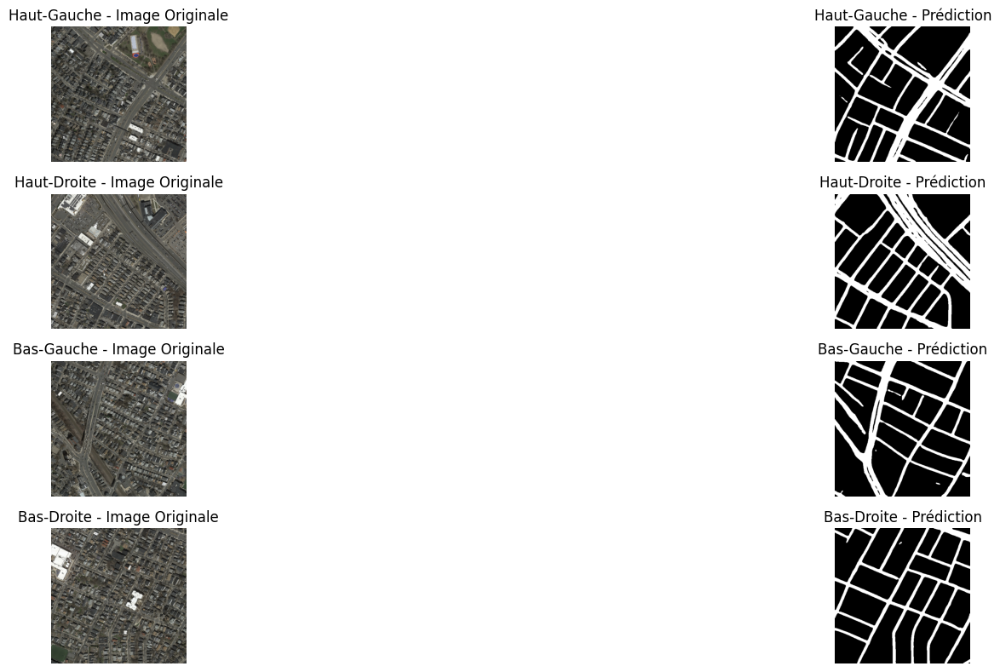

In [37]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from segmentation_models_pytorch import Unet  # Modifier selon votre modèle

# 🔹 Définition du device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔹 Charger le modèle
def load_model(model_path):
    model = Unet(encoder_name="resnet50", in_channels=3, classes=1)  # Modifier selon votre modèle
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()
    return model

# 🔹 Fonction de prétraitement du patch
def preprocess_patch(image):
    """
    Normalise et transpose une image en tenseur torch.
    """
    image = image / 255.0
    image = np.transpose(image, (2, 0, 1))  # (H, W, C) -> (C, H, W)
    return torch.tensor(image, dtype=torch.float32).unsqueeze(0).to(device)

# 🔹 Fonction d’inférence sur un patch
def predict_patch(model, patch, threshold=0.3):
    with torch.no_grad():
        output = model(patch)  
        probs = torch.sigmoid(output)
        pred = (probs > threshold).float().cpu().numpy()
    return pred[0, 0]  # Retourne le masque de segmentation

# 🔹 Fonction principale pour découper l'image et afficher les prédictions
def process_large_image(model, image_path, mask_path=None):
    """
    Charge une image de 2048x2048, la divise en 4 patches de 512x512,
    applique le modèle de segmentation sur chaque patch et affiche les résultats.
    
    Args:
        model (torch.nn.Module): Modèle PyTorch chargé.
        image_path (str): Chemin de l'image d'entrée.
        mask_path (str): Chemin du masque Ground Truth (optionnel).
    """
    # Charger l’image complète (2048x2048)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    H, W, _ = image.shape
    
    if H != 2048 or W != 2048:
        image = cv2.resize(image, (2048, 2048))

    # Charger le masque Ground Truth (si fourni)
    mask = None
    if mask_path:
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is not None and mask.shape[:2] != (2048, 2048):
            mask = cv2.resize(mask, (2048, 2048))

    # Définition des 4 patches de 512x512
    patches = [
        ("Haut-Gauche", image[:512, :512], mask[:512, :512] if mask is not None else None),
        ("Haut-Droite", image[:512, 512:1024], mask[:512, 512:1024] if mask is not None else None),
        ("Bas-Gauche", image[512:1024, :512], mask[512:1024, :512] if mask is not None else None),
        ("Bas-Droite", image[512:1024, 512:1024], mask[512:1024, 512:1024] if mask is not None else None),
    ]

    plt.figure(figsize=(15, 8))

    for idx, (title, img_patch, mask_patch) in enumerate(patches):
        # Convertir en tenseur et faire la prédiction
        patch_tensor = preprocess_patch(img_patch)
        pred_mask = predict_patch(model, patch_tensor)

        # Affichage
        plt.subplot(4, 3, idx * 3 + 1)
        plt.imshow(img_patch)
        plt.title(f"{title} - Image Originale")
        plt.axis("off")

        if mask_patch is not None:
            plt.subplot(4, 3, idx * 3 + 2)
            plt.imshow(mask_patch, cmap="gray")
            plt.title(f"{title} - Ground Truth")
            plt.axis("off")

        plt.subplot(4, 3, idx * 3 + 3)
        plt.imshow(pred_mask, cmap="gray")
        plt.title(f"{title} - Prédiction")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# 🔹 Charger le modèle
model_path = "/kaggle/input/unett/pytorch/default/1/road_segmentation_modelUnet.pth"
model = load_model(model_path)

# 🔹 Définir le chemin de l'image (2048x2048)
image_path = "/kaggle/input/validtest/valid/images/region_129_sat.png"
mask_path = "/kaggle/input/validtest/valid/masks/region_129_mask.png"  # Optionnel

# 🔹 Appliquer et afficher la segmentation sur les 4 patches de 512x512
process_large_image(model, image_path, mask_path)


<ipython-input-39-81a787b0b2f8>:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


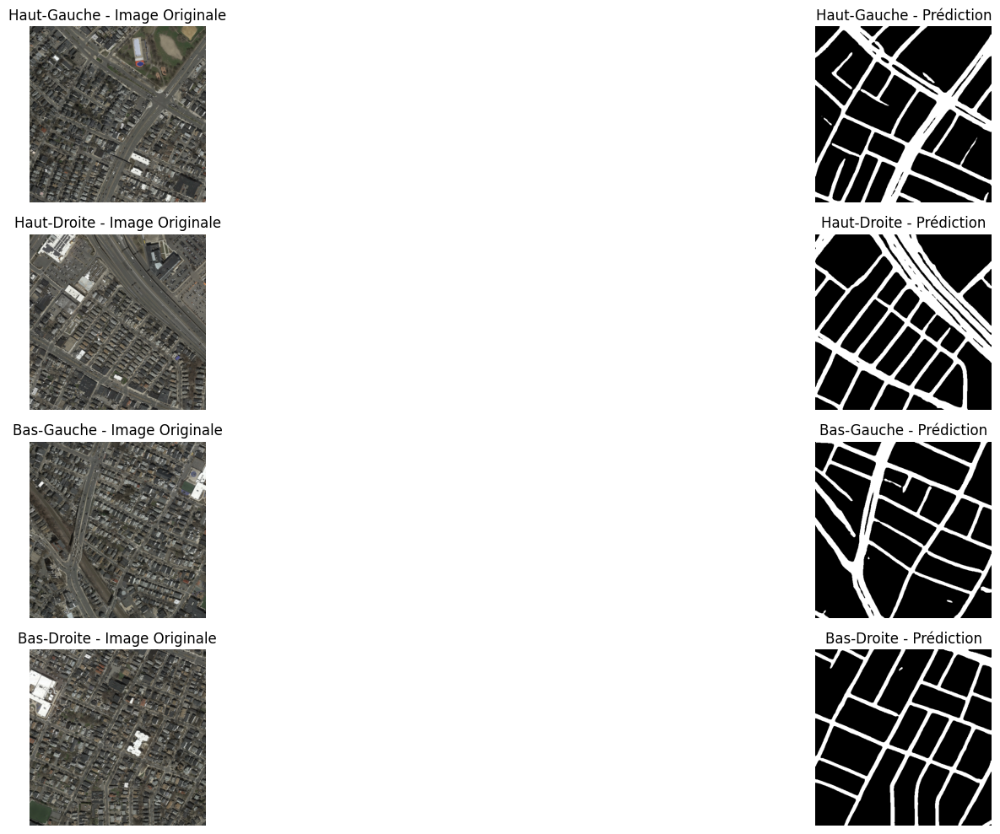

In [39]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
from segmentation_models_pytorch import Unet  # Modifier selon votre modèle

# 🔹 Définition du device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔹 Charger le modèle
def load_model(model_path):
    model = Unet(encoder_name="resnet50", in_channels=3, classes=1)  # Modifier selon votre modèle
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()
    return model

# 🔹 Fonction de prétraitement du patch
def preprocess_patch(image):
    """
    Normalise et transpose une image en tenseur torch.
    """
    image = image / 255.0
    image = np.transpose(image, (2, 0, 1))  # (H, W, C) -> (C, H, W)
    return torch.tensor(image, dtype=torch.float32).unsqueeze(0).to(device)

# 🔹 Fonction d’inférence sur un patch
def predict_patch(model, patch, threshold=0.3):
    with torch.no_grad():
        output = model(patch)  
        probs = torch.sigmoid(output)
        pred = (probs > threshold).float().cpu().numpy()
    return pred[0, 0]  # Retourne le masque de segmentation

# 🔹 Fonction principale pour découper l'image et afficher les prédictions
def process_large_image(model, image_path, mask_path=None):
    """
    Charge une image de 2048x2048, la divise en 4 patches de 512x512,
    applique le modèle de segmentation sur chaque patch et affiche les résultats.
    
    Args:
        model (torch.nn.Module): Modèle PyTorch chargé.
        image_path (str): Chemin de l'image d'entrée.
        mask_path (str): Chemin du masque Ground Truth (optionnel).
    """
    # Charger l’image complète (2048x2048)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    H, W, _ = image.shape
    
    if H != 2048 or W != 2048:
        image = cv2.resize(image, (2048, 2048))

    # Charger le masque Ground Truth (si fourni)
    mask = None
    if mask_path:
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is not None and mask.shape[:2] != (2048, 2048):
            mask = cv2.resize(mask, (2048, 2048))

    # Définition des 4 patches de 512x512
    patches = [
        ("Haut-Gauche", image[:512, :512], mask[:512, :512] if mask is not None else None),
        ("Haut-Droite", image[:512, 512:1024], mask[:512, 512:1024] if mask is not None else None),
        ("Bas-Gauche", image[512:1024, :512], mask[512:1024, :512] if mask is not None else None),
        ("Bas-Droite", image[512:1024, 512:1024], mask[512:1024, 512:1024] if mask is not None else None),
    ]

    plt.figure(figsize=(15, 10))

    for idx, (title, img_patch, mask_patch) in enumerate(patches):
        # Convertir en tenseur et faire la prédiction
        patch_tensor = preprocess_patch(img_patch)
        pred_mask = predict_patch(model, patch_tensor)

        # Affichage correct avec 3 colonnes (Original, GT, Prédiction)
        plt.subplot(4, 3, idx * 3 + 1)
        plt.imshow(img_patch)
        plt.title(f"{title} - Image Originale")
        plt.axis("off")

        if mask_patch is not None:
            plt.subplot(4, 3, idx * 3 + 2)
            plt.imshow(mask_patch, cmap="gray")
            plt.title(f"{title} - Ground Truth")
            plt.axis("off")
        else:
            plt.subplot(4, 3, idx * 3 + 2)
            plt.axis("off")

        plt.subplot(4, 3, idx * 3 + 3)
        plt.imshow(pred_mask, cmap="gray")
        plt.title(f"{title} - Prédiction")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# 🔹 Charger le modèle
model_path = "/kaggle/input/unett/pytorch/default/1/road_segmentation_modelUnet.pth"
model = load_model(model_path)

# 🔹 Définir le chemin de l'image (2048x2048)
image_path = "/kaggle/input/validtest/valid/images/region_129_sat.png"
mask_path = "/kaggle/input/validtest/valid/masks/region_129_mask.png"  # Optionnel

# 🔹 Appliquer et afficher la segmentation sur les 4 patches de 512x512
process_large_image(model, image_path, mask_path)


<ipython-input-60-540295c6fdb1>:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=device))


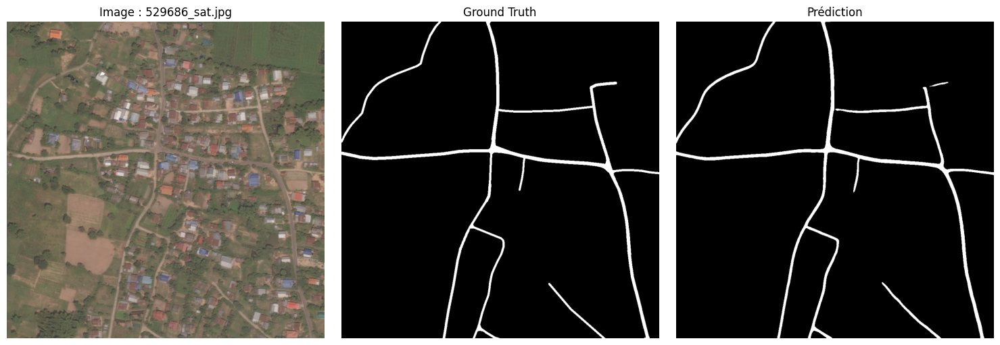

In [60]:
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import random
from segmentation_models_pytorch import Unet  # Modifier selon votre modèle

# 🔹 Définition du device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 🔹 Charger le modèle
def load_model(model_path):
    model = Unet(encoder_name="resnet50", in_channels=3, classes=1)  # Modifier selon votre modèle
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()
    return model

# 🔹 Fonction de prétraitement de l’image
def preprocess_image(image_path, img_size=1024):
    image = cv2.imread(image_path)  
    if image is None:
        raise FileNotFoundError(f"L'image n'a pas été trouvée : {image_path}")
        
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  
    image = cv2.resize(image, (img_size, img_size))  

    # Normalisation (0-1) et transposition en (C, H, W)
    image = image / 255.0
    image = np.transpose(image, (2, 0, 1))  

    image = torch.tensor(image, dtype=torch.float32).unsqueeze(0).to(device)
    
    return image

# 🔹 Fonction d’inférence
def predict_image(model, image_path, threshold=0.3, img_size=1024):
    image = preprocess_image(image_path, img_size)
    
    with torch.no_grad():
        output = model(image)  
        probs = torch.sigmoid(output)
        pred = (probs > threshold).float().cpu().numpy()

    return pred[0, 0]  # Retourne le masque de segmentation

# 🔹 Fonction pour afficher une image aléatoire avec son masque et sa prédiction
def show_random_prediction(model, image_dir, mask_dir, img_size=1024):
    """
    Sélectionne une image aléatoire depuis `image_dir`, charge son masque depuis `mask_dir`,
    effectue une prédiction et affiche le tout.
    
    Args:
        model (torch.nn.Module): Modèle PyTorch chargé.
        image_dir (str): Dossier contenant les images.
        mask_dir (str): Dossier contenant les masques correspondants.
        img_size (int): Taille d'entrée du modèle.
    """
    # Lister toutes les images disponibles
    image_files = [f for f in os.listdir(image_dir) if f.endswith((".jpg", ".png"))]
    
    if not image_files:
        raise FileNotFoundError("Aucune image trouvée dans le dossier spécifié.")

    # Sélectionner une image aléatoire
    image_file = random.choice(image_files)
    image_path = os.path.join(image_dir, image_file)

    # Trouver le masque correspondant
    mask_file = image_file.replace("_sat.jpg", "_mask.png").replace("_sat.png", "_mask.png")
    mask_path = os.path.join(mask_dir, mask_file)

    # Vérifier si le masque existe
    if not os.path.exists(mask_path):
        raise FileNotFoundError(f"Le masque correspondant à {image_file} n'a pas été trouvé.")

    # Charger l’image originale
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_resized = cv2.resize(image, (img_size, img_size))

    # Charger le masque Ground Truth
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask_resized = cv2.resize(mask, (img_size, img_size))

    # Obtenir la prédiction du modèle
    pred_mask = predict_image(model, image_path, img_size=img_size)

    # Affichage
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image_resized)
    plt.title(f"Image : {image_file}")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(mask_resized, cmap="gray")
    plt.title("Ground Truth")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask, cmap="gray")
    plt.title("Prédiction")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# 🔹 Charger le modèle
model_path = "/kaggle/input/unett/pytorch/default/1/road_segmentation_modelUnet.pth"
model = load_model(model_path)

# 🔹 Définir les dossiers contenant les images et masques
image_dir = "/kaggle/input/dpglobe/deepglobe/valid/images"
mask_dir = "/kaggle/input/dpglobe/deepglobe/valid/masks"

# 🔹 Afficher une image aléatoire avec son masque et sa prédiction
show_random_prediction(model, image_dir, mask_dir, img_size=1024)


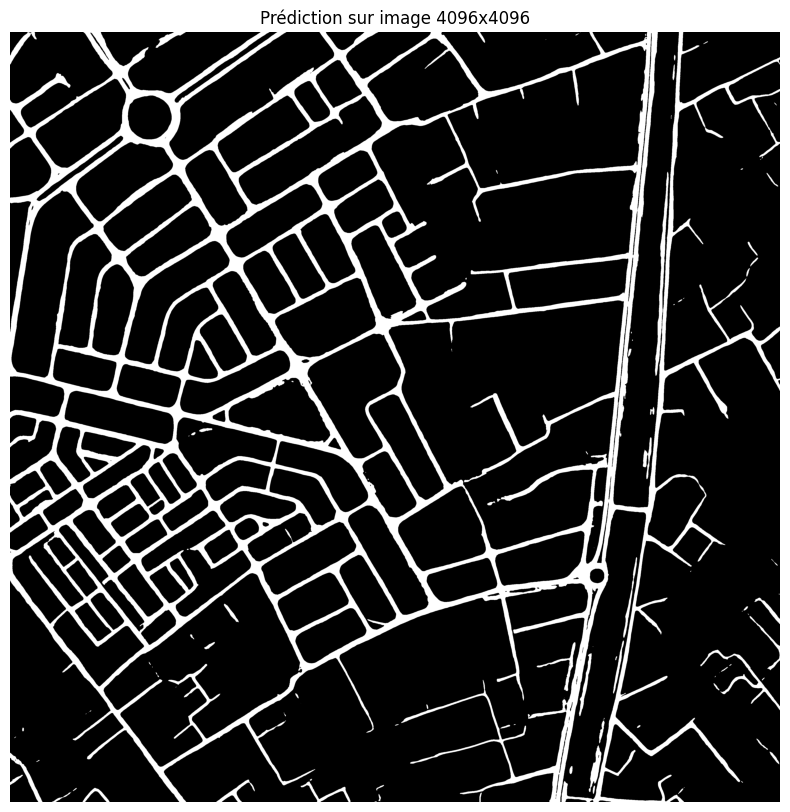

In [4]:
# Prédire le masque pour une grande image
large_image_path = "/kaggle/input/sfaxxx/patch_000576.png"
predicted_mask = predict_image(model, large_image_path, img_size=4096)

# Afficher la prédiction
plt.figure(figsize=(10, 10))
plt.imshow(predicted_mask, cmap="gray")
plt.title("Prédiction sur image 4096x4096")
plt.axis("off")
plt.show()
